**EVALUATION PROJECT 10 - Zomato Restaurant Project**

By : **HARSH NEMA**

BATCH : **DS052**

**Problem Statement:**

Zomato Data Analysis is one of the most useful analysis for foodies who want to taste the best cuisines of every part of the world which lies in their budget. This analysis is also for those who want to find the value for money restaurants in various parts of the country for the cuisines. Additionally, this analysis caters the needs of people who are striving to get the best cuisine of the country and which locality of that country serves that cuisines with maximum number of restaurants.

**Data Storage:**

This problem statement contains two datasets- **Zomato.csv** and **country_code.csv.**

**Country_code.csv** contains two variables:

* Country code
* Country name

The collected data has been stored in the Comma Separated Value file **Zomato.csv**. Each restaurant in the dataset is uniquely identified by its Restaurant Id. Every Restaurant contains the following variables:

• **Restaurant Id:** Unique id of every restaurant across various cities of the world

• **Restaurant Name:** Name of the restaurant

• **Country Code:** Country in which restaurant is located

• **City:** City in which restaurant is located

• **Address:** Address of the restaurant

• **Locality:** Location in the city

• **Locality Verbose:** Detailed description of the locality

• **Longitude:** Longitude coordinate of the restaurant&#39;s location

• **Latitude:** Latitude coordinate of the restaurant&#39;s location

• **Cuisines:** Cuisines offered by the restaurant

• **Average Cost for two:** Cost for two people in different currencies

• **Currency:** Currency of the country

• **Has Table booking:** yes/no

• **Has Online delivery:** yes/ no

• **Is delivering:** yes/ no

• **Switch to order menu:** yes/no

• **Price range:** range of price of food

• **Aggregate Rating:** Average rating out of 5

• **Rating color:** depending upon the average rating color

• **Rating text:** text on the basis of rating of rating

• **Votes:** Number of ratings casted by people

**In this dataset predict 2 things –**

1)**Average Cost for two**

2) **Price range**


In [2]:
# Importing required libraries
import pandas as pd
import numpy as np
import warnings # Filtering warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from collections import Counter
import plotly.graph_objs as go
import plotly.offline as py

In [3]:
df1 = pd.read_excel('https://raw.githubusercontent.com/dsrscientist/dataset4/main/Country-Code.xlsx')

In [4]:
df2 = pd.read_csv('https://raw.githubusercontent.com/dsrscientist/dataset4/main/zomato.csv',engine='python',encoding="ISO-8859-1")

In [4]:
df1

,Country Code,Country
0,1,India
1,14,Australia
2,30,Brazil
3,37,Canada
4,94,Indonesia
5,148,New Zealand
6,162,Phillipines
7,166,Qatar
8,184,Singapore
9,189,South Africa


In [5]:
df2.tail()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
9546,5915730,NamlÛ± Gurme,208,ÛÁstanbul,"Kemankeô Karamustafa Paôa Mahallesi, RÛ±htÛ±...",Karakí_y,"Karakí_y, ÛÁstanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz AÛôacÛ±,208,ÛÁstanbul,"Koôuyolu Mahallesi, Muhittin íìstí_ndaÛô Cadd...",Koôuyolu,"Koôuyolu, ÛÁstanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,Aôôk Kahve,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901
9550,5927402,Walter's Coffee Roastery,208,ÛÁstanbul,"CafeaÛôa Mahallesi, BademaltÛ± Sokak, No 21/B,...",Moda,"Moda, ÛÁstanbul",29.026016,40.984776,Cafe,...,Turkish Lira(TL),No,No,No,No,2,4.0,Green,Very Good,591


In [5]:
# Merging both df1 and df2 datframe into main datframe
df = pd.merge (df1,df2)

In [7]:
df.shape

(9551, 22)

In [8]:
df.head()

,Country Code,Country,Restaurant ID,Restaurant Name,City,Address,Locality,Locality Verbose,Longitude,Latitude,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,1,India,3400025,Jahanpanah,Agra,"E 23, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",78.011544,27.161661,...,Indian Rupees(Rs.),No,No,No,No,3,3.9,Yellow,Good,140
1,1,India,3400341,Rangrezz Restaurant,Agra,"E-20, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",0.000000,0.000000,...,Indian Rupees(Rs.),No,No,No,No,2,3.5,Yellow,Good,71
2,1,India,3400005,Time2Eat - Mama Chicken,Agra,"Main Market, Sadar Bazaar, Agra Cantt, Agra",Agra Cantt,"Agra Cantt, Agra",78.011608,27.160832,...,Indian Rupees(Rs.),No,No,No,No,2,3.6,Yellow,Good,94
3,1,India,3400021,Chokho Jeeman Marwari Jain Bhojanalya,Agra,"1/48, Delhi Gate, Station Road, Raja Mandi, Ci...",Civil Lines,"Civil Lines, Agra",77.998092,27.195928,...,Indian Rupees(Rs.),No,No,No,No,2,4.0,Green,Very Good,87
4,1,India,3400017,Pinch Of Spice,Agra,"23/453, Opposite Sanjay Cinema, Wazipura Road,...",Civil Lines,"Civil Lines, Agra",78.007553,27.201725,...,Indian Rupees(Rs.),No,No,No,No,3,4.2,Green,Very Good,177


In [9]:
df.isnull().sum()

Country Code            0
Country                 0
Restaurant ID           0
Restaurant Name         0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

In [6]:
# Dropping the missing values in Cuisines
df.dropna(inplace=True)

In [11]:
df.shape

(9542, 22)

In [7]:
df.reset_index()

,index,Country Code,Country,Restaurant ID,Restaurant Name,City,Address,Locality,Locality Verbose,Longitude,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,0,1,India,3400025,Jahanpanah,Agra,"E 23, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",78.011544,...,Indian Rupees(Rs.),No,No,No,No,3,3.9,Yellow,Good,140
1,1,1,India,3400341,Rangrezz Restaurant,Agra,"E-20, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",0.000000,...,Indian Rupees(Rs.),No,No,No,No,2,3.5,Yellow,Good,71
2,2,1,India,3400005,Time2Eat - Mama Chicken,Agra,"Main Market, Sadar Bazaar, Agra Cantt, Agra",Agra Cantt,"Agra Cantt, Agra",78.011608,...,Indian Rupees(Rs.),No,No,No,No,2,3.6,Yellow,Good,94
3,3,1,India,3400021,Chokho Jeeman Marwari Jain Bhojanalya,Agra,"1/48, Delhi Gate, Station Road, Raja Mandi, Ci...",Civil Lines,"Civil Lines, Agra",77.998092,...,Indian Rupees(Rs.),No,No,No,No,2,4.0,Green,Very Good,87
4,4,1,India,3400017,Pinch Of Spice,Agra,"23/453, Opposite Sanjay Cinema, Wazipura Road,...",Civil Lines,"Civil Lines, Agra",78.007553,...,Indian Rupees(Rs.),No,No,No,No,3,4.2,Green,Very Good,177
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9537,9546,216,United States,17697389,The Screaming Eagle,Waterloo,"228 E 4th St., Waterloo, IA 50703",Waterloo,"Waterloo, Waterloo",-92.335523,...,Dollar($),No,No,No,No,1,3.7,Yellow,Good,101
9538,9547,216,United States,17697424,The Thai Bowl,Waterloo,"624 Sycamore Street, Waterloo, IA 50703",Waterloo,"Waterloo, Waterloo",-92.335769,...,Dollar($),No,No,No,No,1,3.5,Yellow,Good,58
9539,9548,216,United States,17697332,Tokyo Japanese Steak House,Waterloo,"1931 Sears Street, Waterloo, IA 50702",Waterloo,"Waterloo, Waterloo",-92.323400,...,Dollar($),No,No,No,No,2,3.9,Yellow,Good,156
9540,9549,216,United States,17694056,Theo Yianni's Authentic Greek Restaurant,Weirton,"322 American Way, Weirton, WV 26062",Weirton,"Weirton, Weirton",-80.529488,...,Dollar($),No,No,No,No,2,3.9,Yellow,Good,156


In [13]:
df.columns.to_series().groupby(df.dtypes).groups

{int64: ['Country Code', 'Restaurant ID', 'Average Cost for two', 'Price range', 'Votes'], float64: ['Longitude', 'Latitude', 'Aggregate rating'], object: ['Country', 'Restaurant Name', 'City', 'Address', 'Locality', 'Locality Verbose', 'Cuisines', 'Currency', 'Has Table booking', 'Has Online delivery', 'Is delivering now', 'Switch to order menu', 'Rating color', 'Rating text']}

In [8]:
# Separating categoricala and numerical variables
catg = ['Country', 'Restaurant Name', 'City', 'Address', 'Locality', 'Locality Verbose', 'Cuisines', 'Currency', 'Has Table booking',
        'Has Online delivery', 'Is delivering now', 'Switch to order menu', 'Rating color', 'Rating text']
num = ['Average Cost for two', 'Price range', 'Votes','Longitude', 'Latitude', 'Aggregate rating']


In [15]:
df[catg].describe().T

,count,unique,top,freq
Country,9542,15,India,8652
Restaurant Name,9542,7437,Cafe Coffee Day,83
City,9542,140,New Delhi,5473
Address,9542,8910,"Sector 41, Noida",11
Locality,9542,1206,Connaught Place,122
Locality Verbose,9542,1263,"Connaught Place, New Delhi",122
Cuisines,9542,1825,North Indian,936
Currency,9542,12,Indian Rupees(Rs.),8652
Has Table booking,9542,2,No,8384
Has Online delivery,9542,2,No,7091


* **Clearly,India constitutes almost 90% of data observations for Zomato Restaurants**

* **New Delhi** has the highest number of restaraunts associated with Zomato

* Restaurants providing only **North-Indian cuisines** are the highest in number with count of approximate 936

* **Cafe Coffee Day** has maximum number of restaurants associated with Zomato

* In New Delhi, **Connaught Place(122)** is the top locality where Zomato is functioning

* **Switch to order menu** has single value (NO) for all the observations and hence it will be better to drop this column

In [9]:
df.drop('Switch to order menu',axis=1,inplace=True)

**RATING ANALYSIS**

In [10]:
ratings=df.groupby(['Aggregate rating','Rating color','Rating text']).size().reset_index().rename(columns={0:'Rating Count'})
ratings

,Aggregate rating,Rating color,Rating text,Rating Count
0,0.0,White,Not rated,2148
1,1.8,Red,Poor,1
2,1.9,Red,Poor,2
3,2.0,Red,Poor,7
4,2.1,Red,Poor,15
5,2.2,Red,Poor,27
6,2.3,Red,Poor,47
7,2.4,Red,Poor,87
8,2.5,Orange,Average,110
9,2.6,Orange,Average,191


* Around 2100 people out of 9542 have given zero ratings --> **No rating**

* Rating between 0 to 2.4 --> **Poor**

* Rating between 2.5 to 3.4 --> **Average**

* Rating between 3.5 to 3.9 --> **Good**

* Rating between 4.0 to 4.4 --> **Very Good**

* Rating between 4.5 to 5.0 --> **Excellent**

In [18]:
df['Rating color'].unique()

array(['Yellow', 'Green', 'Orange', 'Dark Green', 'White', 'Red'],
      dtype=object)

**Yellow** --> **Good**

**Green** --> **Very Good**

**Orange** --> **Average**

**Dark Green** --> **Excellent**

**White** --> **Not rated**

**Red** --> **Poor**

[]

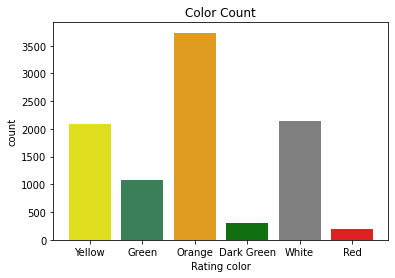

In [19]:
sns.countplot(df['Rating color'],palette=['yellow','seagreen','orange','green','gray','red'])
plt.title('Color Count')
plt.plot()


* In rated Restaurants maximum rating count is for **Average** Rating (color = Orange and value = 3.2)

* In **Good** Category 3.5 was the rating given by maximum users

* In **Very Good** Category 4.0 was the rating given by maximum users

* In **Excellent** Category 4.5 was the rating given by maximum users

In [20]:
#extracting the country who gave the most no. of zero rating and making a data frame
most_zero_rating=df[df["Aggregate rating"]==0].groupby("Country").size().sort_values(ascending=False).reset_index().rename(columns={0:"Count"})
most_zero_rating

,Country,Count
0,India,2139
1,Brazil,5
2,United States,3
3,United Kingdom,1


**Most of the zero ratings is from Indian customers**

**CURRENCY OF DIFFERENT COUNTRIES**

In [21]:
df.groupby(["Country","Currency"]).size().reset_index().rename(columns={0:"Count"})

,Country,Currency,Count
0,Australia,Dollar($),24
1,Brazil,Brazilian Real(R$),60
2,Canada,Dollar($),4
3,India,Indian Rupees(Rs.),8652
4,Indonesia,Indonesian Rupiah(IDR),21
5,New Zealand,NewZealand($),40
6,Phillipines,Botswana Pula(P),22
7,Qatar,Qatari Rial(QR),20
8,Singapore,Dollar($),20
9,South Africa,Rand(R),60


**ONLINE DELIVERY**

In [22]:
df[df["Has Online delivery"]=="Yes"].groupby("Country").size()

Country
India    2423
UAE        28
dtype: int64

* Zomato has **online delivery system** with only **India** and **UAE**

**TOP 10 CUISINES**

Text(0, 0.5, 'Number of Restaurants')

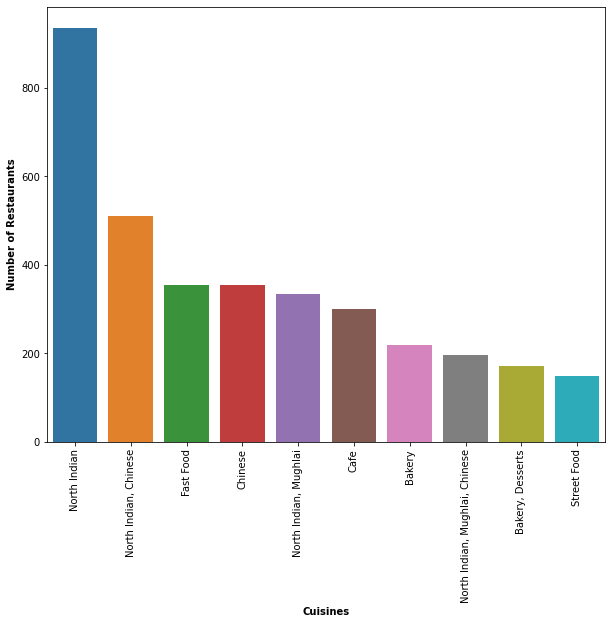

In [23]:
plt.figure(figsize=(10,8))
sns.barplot(x=df["Cuisines"].value_counts()[:10].index,y=df["Cuisines"].value_counts()[:10])
plt.xticks(rotation=90)
plt.xlabel("Cuisines",fontweight="bold")
plt.ylabel("Number of Restaurants",fontweight="bold")

**As majority of the dataset is from India, we will take only India data in one dataframe and take this further to predict our both target variables**

In [10]:
df_India=df[df["Country"]=="India"].reset_index(drop=True).copy()

**1.TARGET VARIABLE : AVERAGE COST FOR TWO**

In [12]:
df_India['Average Cost for two'].describe()

count    8652.000000
mean      623.370319
std       595.676124
min         0.000000
25%       300.000000
50%       450.000000
75%       700.000000
max      8000.000000
Name: Average Cost for two, dtype: float64

**2.TARGET VARIABLE : PRICE RANGE**

In [ ]:
df_India['Price range'].value_counts()

1    4295
2    2858
3    1111
4     388
Name: Price range, dtype: int64

In [11]:
pd.set_option('display.max_rows',None)

In [ ]:
# Seperating the columns according to datatype
df_India.columns.to_series().groupby(df_India.dtypes).groups

{int64: ['Country Code', 'Restaurant ID', 'Average Cost for two', 'Price range', 'Votes'], float64: ['Longitude', 'Latitude', 'Aggregate rating'], object: ['Country', 'Restaurant Name', 'City', 'Address', 'Locality', 'Locality Verbose', 'Cuisines', 'Currency', 'Has Table booking', 'Has Online delivery', 'Is delivering now', 'Rating color', 'Rating text']}

**RESTAURANTS IN DIFFERENT CITIES**

In [14]:
Restaurants=df_India["City"].value_counts().reset_index()
Restaurants["P_City"]=Restaurants.apply(lambda x:x["index"] if x["City"]>=25 else "Other Cities" ,axis=1)
Restaurants.rename(columns={"City":"Count","P_City":"City"},inplace=True)
Final_Restaurants=Restaurants.groupby("City").agg(Count=("Count","sum"))

In [15]:
Final_Restaurants

,Count
City,
Faridabad,251
Ghaziabad,25
Gurgaon,1118
New Delhi,5473
Noida,1080
Other Cities,705


In [25]:
#pLOTTING FINAL RESTAURANTS ON PIE CHART
fig1 = go.Figure(data = go.Pie(values = Final_Restaurants["Count"], 
                               labels = Final_Restaurants.index))

In [27]:
fig1

We found that most of the restaurants are located in **National Capital Region (NCR)** in India. The NCR region consists of **New Delhi** and surrounding cities i.e **Ghaziabad, Faridabad, Gurgaon and Noida.** From the following **Pie Chart** we can see that only **8.15% of restaurants** in the data come from cities **NOT PRESENT in the NCR Region**.

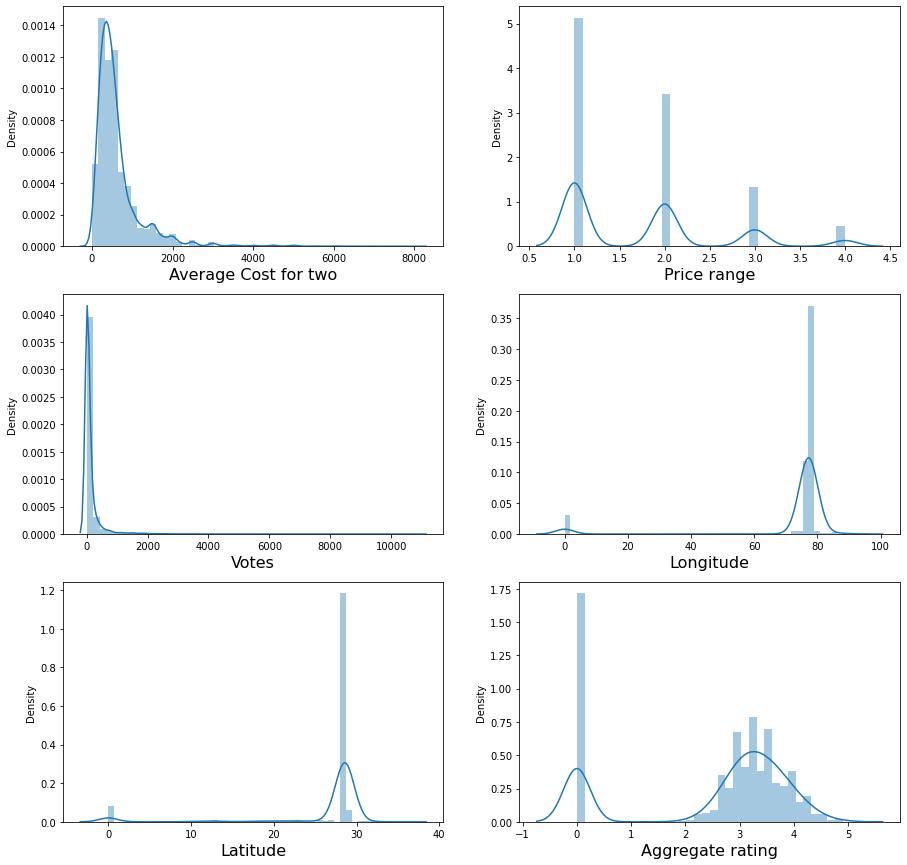

In [30]:
# Lets see how data is distributed for each column. Machine learnong model is built on the assumption that data is
#distributed normally.

plt.figure(figsize=(15,15),facecolor='white')
plotnumber=1

for column in num:
    if plotnumber<=6:
        ax = plt.subplot(3,2,plotnumber)
        sns.distplot(df_India[column])
        plt.xlabel(column,fontsize=16)
    plotnumber+=1
plt.show()

In [31]:
# Checking skewness
df_India.skew()

Country Code            0.000000
Restaurant ID           0.148401
Longitude              -3.773293
Latitude               -3.245603
Average Cost for two    3.583566
Price range             0.999468
Aggregate rating       -0.883031
Votes                   9.656539
dtype: float64

In [33]:
df_India.drop(columns=['Country Code', 'Country', 'Restaurant ID','Address','Currency'],axis=1,inplace=True)

For further processing of data,
* We drop **Country code**, **Country** and **Currency** as for Indian restaurants/data,these columns have same value for all the observations

* Restaurant ID is a nominal data and unique ID for each restaurant, does not contribute in predicting target variable

* Dropping Address column as it is not relevant for our target prediction

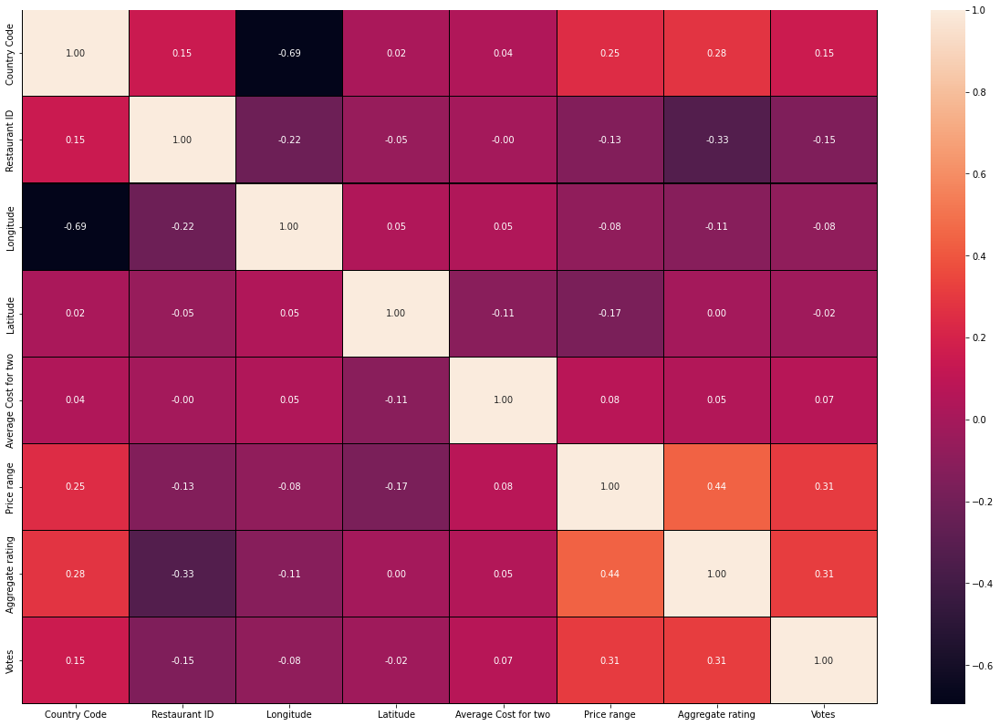

In [34]:
# Plotting heatmap and checking correlation

plt.figure(figsize=(21,14))
sns.heatmap(df.corr(),annot =True,linewidths=0.15,linecolor='black',fmt="0.2f")

In [32]:
df_India.columns

Index(['Country Code', 'Country', 'Restaurant ID', 'Restaurant Name', 'City',
       'Address', 'Locality', 'Locality Verbose', 'Longitude', 'Latitude',
       'Cuisines', 'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Price range',
       'Aggregate rating', 'Rating color', 'Rating text', 'Votes'],
      dtype='object')

**ENCODING THE CATEGORICAL VARIABLES**

In [12]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [13]:
for i in df_India.columns:
    if df_India[i].dtypes == "object":
        df_India[i] = le.fit_transform(df_India[i].values.reshape(-1,1))

In [37]:
df_India.head()

,Restaurant Name,City,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Has Table booking,Has Online delivery,Is delivering now,Price range,Aggregate rating,Rating color,Rating text,Votes
0,2829,0,14,14,78.011544,27.161661,1151,850,0,0,0,3,3.9,5,2,140
1,4680,0,14,14,0.000000,0.000000,1151,700,0,0,0,2,3.5,5,2,71
2,6151,0,14,14,78.011608,27.160832,945,500,0,0,0,2,3.6,5,2,94
3,1477,0,110,111,77.998092,27.195928,1266,400,0,0,0,2,4.0,1,5,87
4,4357,0,110,111,78.007553,27.201725,1012,1000,0,0,0,3,4.2,1,5,177


**Outlier Detection and Removal**

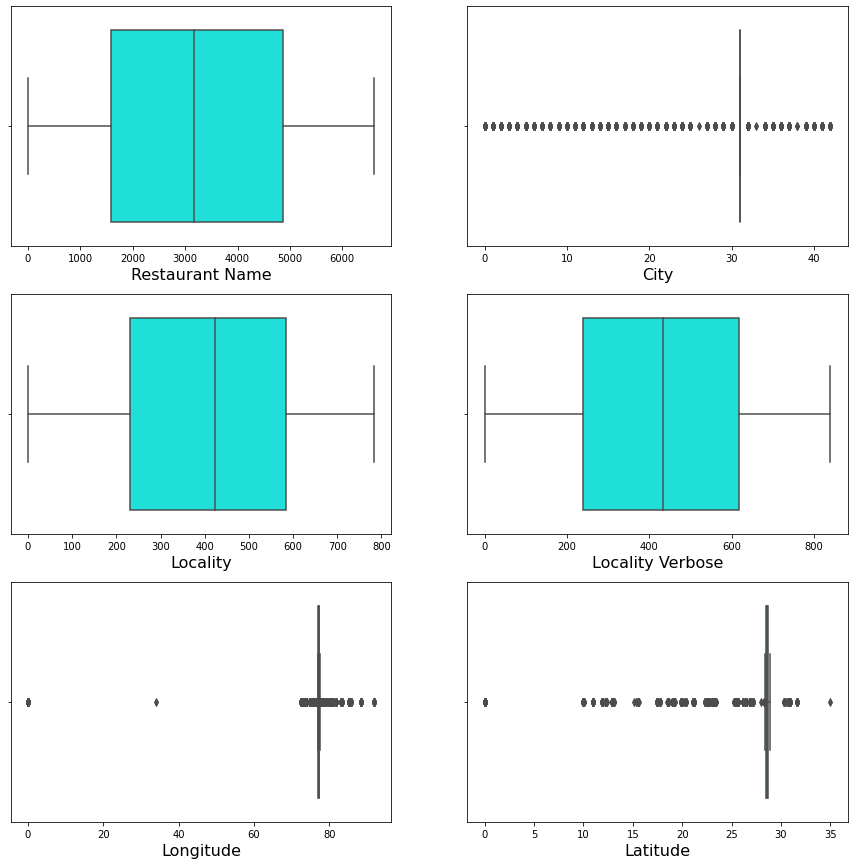

In [39]:
plt.figure(figsize=(15,15),facecolor='white')
plotnumber=1

for column in df_India:
    if plotnumber<=6:
        ax = plt.subplot(3,2,plotnumber)
        sns.boxplot(df_India[column], palette='hsv')
        plt.xlabel(column,fontsize=16)
    plotnumber+=1
plt.show()

**Outliers present in city,latitude and longitude, we can't do much about it so we will proceed as it is**

**Multicollinearity Check**

In [40]:
# Checking multicollinearity in the dataset
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['vif'] = [variance_inflation_factor(df_India.values,i) for i in range(df_India.shape[1])]
vif['Features'] = df_India.columns

vif

,vif,Features
0,3.824215,Restaurant Name
1,11.963136,City
2,2442.623485,Locality
3,2337.099096,Locality Verbose
4,146.994107,Longitude
5,134.218477,Latitude
6,4.150065,Cuisines
7,7.671486,Average Cost for two
8,1.884075,Has Table booking
9,1.603924,Has Online delivery


**Multicollinearity present in the dataset,we will do PCA to reduce the effect of multicollinearity**

**1. MODEL BUILDING - REGRESSION TASK (AVERAGE COST FOR TWO PREDICTION)**

In [14]:
# Seperating features and target variable for Regression task(Average Cost for two)

X_reg = df_India.drop('Average Cost for two',axis=1)

y_reg = df_India['Average Cost for two']

**SkewnessReduction**

In [15]:
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer()
# Applying Power transformer

X_new_ptr = pt.fit_transform(X_reg)

# Converting numpy array(X_new_ptr) into Dataframe and reassigning the values

X_reg = pd.DataFrame(X_new_ptr,columns= X_reg.columns)

# Checking Skewness

X_reg.skew().sort_values(ascending=False)

Is delivering now      15.860698
Has Table booking       2.221850
Has Online delivery     0.979847
Price range             0.230535
Votes                   0.008961
Country                 0.000000
Currency                0.000000
Country Code            0.000000
Rating text            -0.036782
Rating color           -0.079774
Locality Verbose       -0.238381
Restaurant ID          -0.263959
Restaurant Name        -0.268700
Locality               -0.271797
Address                -0.298782
Cuisines               -0.390468
City                   -0.568561
Aggregate rating       -0.627915
Latitude               -2.540500
Longitude              -3.185909
dtype: float64

**SCALING USING STANDARD SCALER**

In [16]:
from sklearn.preprocessing import StandardScaler
scaler= StandardScaler()
X_scaled = scaler.fit_transform(X_reg)

**PRINCIPAL COMPONENT ANALYSIS**

In [17]:
from sklearn.decomposition import PCA
pca = PCA()
pca.fit_transform(X_scaled)

array([[ 1.88667585e+00,  2.60657074e+00, -5.07884773e-01, ...,
         8.64147900e-17, -4.47181948e-16,  0.00000000e+00],
       [ 3.39931409e-01,  5.20515063e+00,  2.30580617e+00, ...,
        -2.01287569e-15,  1.30102047e-15,  0.00000000e+00],
       [ 1.38386195e+00,  2.51978292e+00, -6.60617566e-01, ...,
        -9.42536803e-18, -3.63902607e-18, -0.00000000e+00],
       ...,
       [ 3.31854170e-01, -5.35062313e-01,  1.81555618e+00, ...,
        -4.39054944e-18,  2.71476238e-18,  0.00000000e+00],
       [-3.35312900e-01, -5.17314401e-01,  2.10761607e+00, ...,
         1.57761575e-18,  2.85658818e-18,  0.00000000e+00],
       [ 8.61681994e-01, -7.85085331e-01,  2.00314874e+00, ...,
        -6.03555486e-18,  2.29669411e-18,  0.00000000e+00]])

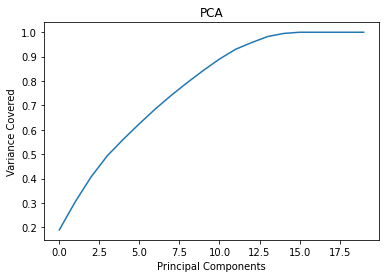

In [18]:
# Lets plot scree plot to check the best components

plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principal Components')
plt.ylabel('Variance Covered')
plt.title('PCA')
plt.show()

*12 components are able to explain more than 95% variance and hence considering 12 PC's*

In [19]:
pca = PCA(n_components=12)
new_pcomp = pca.fit_transform(X_scaled)
X_pca = pd.DataFrame(new_pcomp,columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12'])
X_pca

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12
0,1.886676,2.606571,-0.507885,-0.887665,0.440752,0.982790,-1.390348,0.204767,-1.559978,-0.601854,0.500548,0.789080
1,0.339931,5.205151,2.305806,1.502023,0.225552,1.411507,-0.262452,-0.265025,-1.502866,-1.128408,1.166123,-0.598755
2,1.383862,2.519783,-0.660618,-1.032617,0.592257,1.637377,-1.022273,-1.124976,-1.344964,-0.397155,1.104477,0.555048
3,1.971008,1.907312,-0.410682,0.610968,0.046551,0.344939,-1.401899,0.718851,-2.502345,0.270650,-1.497421,1.680673
4,2.415746,1.855922,0.102735,0.163791,0.141291,0.986295,-1.110757,-0.582391,-2.117404,0.576823,-0.914833,1.755591
5,0.934811,4.350999,3.386521,2.239102,0.340771,1.494308,-0.877171,-0.111676,-1.152348,-0.403527,-0.075062,0.489591
6,1.897317,0.801791,1.041429,-0.217404,0.354338,1.665680,-1.574018,-0.467040,-1.243647,-0.060540,-0.255857,1.982308
7,1.491576,0.846620,0.939588,-0.315671,0.438094,1.729764,-1.444286,-1.011092,-1.166988,0.382290,-0.211866,1.628114
8,-0.130719,3.548162,3.610038,1.652156,-0.381722,0.336351,-0.130517,0.907463,-2.199051,-0.917014,0.291647,-0.462459
9,0.352754,-0.134766,1.473506,-1.135935,0.359187,0.669785,-1.610913,0.818114,-1.193241,-0.802735,0.611623,0.874339


In [20]:
# Importing required libraries

from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge, Lasso, RidgeCV, LassoCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import AdaBoostRegressor, GradientBoostingRegressor
import pickle
from sklearn import metrics
from sklearn.model_selection import cross_val_score

*BEST RANDOM STATE*

In [48]:
maxR2score = 0 # Max R2 score
maxRS = 0   # Best random state for which maximum r2 score is achieved

for i in range(1,1000):
    X_train,X_test,y_train,y_test = train_test_split(X_pca,y_reg,test_size=0.2,random_state=i)
    
    knn = KNeighborsRegressor()
    
    knn.fit(X_train,y_train)
    
    pred_knn = knn.predict(X_test)
   
    score_knn = r2_score(y_test,pred_knn)
     
    
    if score_knn>maxR2score:
   
        maxR2score = score_knn
              
        maxRS = i
print("Maximum R2 Score:",maxR2score,"at random state ", maxRS)

Maximum R2 Score: 0.7436531292147162 at random state  391


*TRAIN TEST SPLIT USING BEST RANDOM STATE*

In [21]:
X_train,X_test,y_train,y_test = train_test_split(X_pca,y_reg,test_size=0.2,random_state=391)

**LINEAR REGRESSION**

In [22]:
lr = LinearRegression()

lr.fit(X_train,y_train)

pred_train = lr.predict(X_train)

pred_test = lr.predict(X_test)

score_train = r2_score(y_train,pred_train)

score_test = r2_score(y_test,pred_test)

print("Training accuracy:",score_train*100)

print("Testing accuracy:",score_test*100)

cv_score = cross_val_score(lr,X_pca,y_reg,cv=5)

cv_mean = cv_score.mean()

print(f"At cross fold 5, the cv score is {cv_mean} and accuracy score for training is {score_train} and accuracy for testing is {score_test}")

# MSE - ignoring some outliers means larger errors are punished. Hard to interpretate but most popular

mse = mean_squared_error(y_test,pred_test)

# RMSE

rmse = np.sqrt(mse)

print("Root mean squared Error:",rmse)

Training accuracy: 58.68544119817756
Testing accuracy: 66.38027977136306
At cross fold 5, the cv score is 0.5719884186584527 and accuracy score for training is 0.5868544119817756 and accuracy for testing is 0.6638027977136307
Root mean squared Error: 353.8088296328769


**LASSO REGULARIZATION**

In [51]:
lasscv = LassoCV(alphas = None, max_iter = 1000, normalize = True)

lasscv.fit(X_train,y_train)

#Best alpha parameter
alpha = lasscv.alpha_

lasso_reg =Lasso(alpha)

lasso_reg.fit(X_train,y_train)

pred_test = lasso_reg.predict(X_test)

print(lasso_reg.score(X_test,y_test)*100)

66.4101043332594


**KNN REGRESSOR**

In [23]:
knn = KNeighborsRegressor()

knn.fit(X_train,y_train)

pred_train = knn.predict(X_train)       # Predicting training data with the model

acc_train = metrics.r2_score(y_train,pred_train)    # Training accuracy

print("=====K Neighbors Regressor=====")

print("R square score for training dataset for K Neighbors regressor: ", acc_train)

pred_test = knn.predict(X_test)       # Predicting test data with the model

acc_test = metrics.r2_score(y_test,pred_test)     # Testing accuracy

print("R square score for test dataset for K Neighbors Regressor: ", acc_test)

knn_score = cross_val_score(knn,X_pca,y_reg,cv=5)

knn_m = knn_score.mean()

print("Cross val score for K Neighbors Regresor:",knn_m*100)


mse = mean_squared_error(y_test,pred_test)

# RMSE

rmse = np.sqrt(mse)

print("Root mean squared Error:",rmse)

=====K Neighbors Regressor=====
R square score for training dataset for K Neighbors regressor:  0.7524834082086007
R square score for test dataset for K Neighbors Regressor:  0.7253274702606718
Cross val score for K Neighbors Regresor: 48.73726398120504
Root mean squared Error: 319.80056971576164


*Tuning parameters for KNN Regressor*

In [53]:
params_knn = {'n_neighbors':[4,8,12,16],
              'weights':['uniform','distance'],
              'algorithm':['auto','ball_tree', 'kd_tree', 'brute'],
              'n_jobs':[-1,1]
             }

grd_knn = GridSearchCV(knn,params_knn)

grd_knn.fit(X_train,y_train)

print(grd_knn.best_params_)

{'algorithm': 'brute', 'n_jobs': -1, 'n_neighbors': 8, 'weights': 'distance'}


In [54]:
knn = grd_knn.best_estimator_

knn.fit(X_train,y_train)

pred_train = knn.predict(X_train)       # Predicting training data with the model

acc_train = metrics.r2_score(y_train,pred_train)    # Training accuracy

print("R square score for training dataset for K Neighbors regressor after tuning: ", acc_train)

pred_test = knn.predict(X_test)       # Predicting test data with the model

acc_test = metrics.r2_score(y_test,pred_test)

print("R square score for test dataset for K Neighbors Regressor after tuning: ", acc_test)

knn_score = cross_val_score(knn,X_pca,y_reg,cv=5)

knn_m = knn_score.mean()

print("Cross val score for K Neighbors Regresor after tuning:",knn_m*100)


mse = mean_squared_error(y_test,pred_test)

# RMSE

rmse = np.sqrt(mse)

print("Root mean squared Error for K Neighbors Regressor after tuning:",rmse)

R square score for training dataset for K Neighbors regressor after tuning:  0.9999999999999868
R square score for test dataset for K Neighbors Regressor after tuning:  0.7477665738011279
Cross val score for K Neighbors Regresor after tuning: 53.762308456651176
Root mean squared Error for K Neighbors Regressor after tuning: 306.4593943590848


**RANDOM FOREST REGRESSOR**

In [24]:
rf = RandomForestRegressor()

rf.fit(X_train,y_train)

rf.score(X_train,y_train)

pred_train = rf.predict(X_train)

pred_test = rf.predict(X_test)

score_train = r2_score(y_train,pred_train)

score_test = r2_score(y_test,pred_test)

print("=====RANDOM FOREST REGRESSOR=====")

print("Training accuracy for Random Forest model:",score_train*100)

print("Testing accuracy for Random Forest model:",score_test*100)

cv_score = cross_val_score(rf,X_pca,y_reg,cv=5)

cv_mean = cv_score.mean()

print(f"At cross fold 5, the cv score is {cv_mean*100} ")

# MSE - ignoring some outliers means larger errors are punished. Hard to interpretate but most popular

mse = mean_squared_error(y_test,pred_test)

# RMSE

rmse = np.sqrt(mse)

print("Root mean squared Error for Random Forest Regressor:",rmse)


=====RANDOM FOREST REGRESSOR=====
Training accuracy for Random Forest model: 95.18466358464057
Testing accuracy for Random Forest model: 77.03565992959987
At cross fold 5, the cv score is 47.96578701631564 
Root mean squared Error for Random Forest Regressor: 292.4142979613414


*TUNING PARAMETERS FOR RANDOM FOREST REGRESSOR*

In [57]:
params_rf = {'min_samples_split':(2,3,4,5),
             'min_samples_leaf' :(2,3,4),             
             'max_depth':(10,15,20)}

grd_rf = GridSearchCV(rf,params_rf)

grd_rf.fit(X_train,y_train)

print(grd_rf.best_params_)

{'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 4}


In [58]:
rf = grd_rf.best_estimator_

rf.fit(X_train,y_train)

rf.score(X_train,y_train)

pred_test = rf.predict(X_test)

rfs = r2_score(y_test,pred_test)

print("=====After tuning parameters of Random Forest=====")

print("R2 score for Random Forest Model after tuning:",rfs*100)

rf_score = cross_val_score(rf,X_pca,y_reg,cv=5)

rfc = rf_score.mean()

print("Cross val score for Random Forest model after tuning:",rfc*100)

# MSE - ignoring some outliers means larger errors are punished. Hard to interpretate but most popular

mse = mean_squared_error(y_test,pred_test)

# RMSE

rmse = np.sqrt(mse)

print("Root mean squared Error for Random Forest model after tuning:",rmse)

=====After tuning parameters of Random Forest=====
R2 score for Random Forest Model after tuning: 82.25709759096834
Cross val score for Random Forest model after tuning: 63.126029992870194
Root mean squared Error for Random Forest model after tuning: 257.030079944474


**XGradient Boosting Regressor**

In [25]:
from xgboost import XGBRegressor
xgb = XGBRegressor()

xgb.fit(X_train,y_train)

xgb.score(X_train,y_train)

pred_train = xgb.predict(X_train)

pred_test = xgb.predict(X_test)

score_train = r2_score(y_train,pred_train)

score_test = r2_score(y_test,pred_test)

print("=====XGradient Boosting REGRESSOR=====")

print("Training accuracy for XGradient Boost model:",score_train*100)

print("Testing accuracy for XGradient Boost model:",score_test*100)

cv_score = cross_val_score(xgb,X_pca,y_reg,cv=5)

cv_mean = cv_score.mean()

print(f"At cross fold 5, the cv score is {cv_mean*100} ")

# MSE - ignoring some outliers means larger errors are punished. Hard to interpretate but most popular

mse = mean_squared_error(y_test,pred_test)

# RMSE

rmse = np.sqrt(mse)
rmse = np.sqrt(mse)

print("Root mean squared Error for XGradient Boosting model:",rmse)

[16:39:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
=====XGradient Boosting REGRESSOR=====
Training accuracy for XGradient Boost model: 74.04746681881636
Testing accuracy for XGradient Boost model: 76.08038045639317
[16:39:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[16:39:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[16:39:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[16:39:28] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[16:39:29] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
At cross fold 5, the cv score is 53.82506278148181 
Root mean squared Erro

*TUNING PARAMETERS FOR XGB*

In [60]:
params_xgb = {'max_depth':[3,6,9,12],
              'learning_rate':[0.001,0.01,0.1],
              'min_child_weight':[1,2,3,4,5],
              'max_delta_step':[0,1,2,3]
             }

grd_xgb = GridSearchCV(xgb,params_xgb)

grd_xgb.fit(X_train,y_train)

print(grd_xgb.best_params_)

[11:31:53] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:31:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:31:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:31:54] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:31:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:31:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:31:55] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[11:31:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of re

In [26]:
xgb = XGBRegressor(learning_rate = 0.1,max_delta_step = 0,max_depth = 6,min_child_weight = 4)

xgb.fit(X_train,y_train)

xgb.score(X_train,y_train)

pred_train = xgb.predict(X_train)

pred_test = xgb.predict(X_test)

score_train = r2_score(y_train,pred_train)

score_test = r2_score(y_test,pred_test)

print("=====XGradient Boosting REGRESSOR=====")

print("Training accuracy for XGradient Boost model:",score_train*100)

print("Testing accuracy for XGradient Boost model:",score_test*100)

cv_score = cross_val_score(xgb,X_pca,y_reg,cv=5)

cv_mean = cv_score.mean()

print(f"At cross fold 5, the cv score is {cv_mean*100} ")

# MSE - ignoring some outliers means larger errors are punished. Hard to interpretate but most popular

mse = mean_squared_error(y_test,pred_test)

# RMSE

rmse = np.sqrt(mse)
rmse = np.sqrt(mse)

print("Root mean squared Error for XGradient Boosting model:",rmse)

[16:43:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
=====XGradient Boosting REGRESSOR=====
Training accuracy for XGradient Boost model: 90.965981391081
Testing accuracy for XGradient Boost model: 77.48516351046734
[16:43:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[16:43:10] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[16:43:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[16:43:13] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[16:43:15] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
At cross fold 5, the cv score is 53.37865889158804 
Root mean squared Error 

**Among all the model above , XGradient Boost Regressor fits the best for the given dataset for the prediction of Average cost for two as there is minimum difference between training and test accuracy**

**Saving the model for Regression task**

In [27]:
import pickle
filename = 'AvgCost_pred_reg.pkl'
pickle.dump(xgb,open(filename,'wb'))

**Conclusion for Regression task**

In [28]:
loaded_model = pickle.load(open('AvgCost_pred_reg.pkl','rb'))
result = loaded_model.score(X_test,y_test)
pred_test = loaded_model.predict(X_test)
print(result*100,'%')

[16:50:36] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
77.48516351046734 %


In [29]:
conclusion_avgcost = pd.DataFrame([loaded_model.predict(X_test)[:],y_test[:]],index=["Predicted","Original"])
conclusion_avgcost

,0,1,2,3,4,5,6,7,8,9,...,1721,1722,1723,1724,1725,1726,1727,1728,1729,1730
Predicted,543.785156,269.731323,331.51593,300.760376,662.23877,298.404266,249.378632,1519.202026,275.527161,358.040131,...,388.104004,277.10614,387.776154,1552.136841,291.589783,697.553223,644.004456,1284.256348,754.217407,366.546509
Original,300.000000,450.000000,300.00000,250.000000,1500.00000,300.000000,300.000000,2200.000000,100.000000,450.000000,...,450.000000,250.00000,500.000000,1500.000000,250.000000,1700.000000,550.000000,900.000000,600.000000,300.000000


**2. MODEL BUILDING - PRICE RANGE PREDICTION (CLASSIFICATION TASK)**

In [30]:
# Importing required libraries

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score,classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import plot_roc_curve
from sklearn.ensemble import AdaBoostClassifier,GradientBoostingClassifier
import pickle
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split,GridSearchCV

**FUNCTION FOR CALCULATING MODEL PERFORMANCE**

In [31]:
# Defining function for calculating the performance of the classification model

def metric_score(clf,X_train,X_test,y_train,y_test,train = True):
    if train:
        y_pred = clf.predict(X_train)
        
        print("-----------------Train Result--------------------")
        
        print(f"Train Accuracy Score : {accuracy_score(y_train,y_pred)*100:.2f}%")
        
    elif train == False:
        
        pred = clf.predict(X_test)
        
        matrix = confusion_matrix(y_test,pred)
        
        print("-----------------Test Result--------------------")
        
        print("=====Confusion Matrix======= \n",matrix)
        
        print(f"Test Accuracy Score : {accuracy_score(y_test,pred)*100:.2f}%")
        
        print("\n Test Classification Report \n ", classification_report(y_test,pred,digits =2))

In [32]:
# Seperating features and target variable for classification task(Price range prediction)

X_clf = df_India.drop('Price range',axis=1)

y_clf = df_India['Price range']

In [33]:
# Applying Power transformer

X_new_pt = pt.fit_transform(X_clf)

# Converting numpy array(X_new_pt) into Dataframe and reassigning the values

X_clf = pd.DataFrame(X_new_pt,columns= X_clf.columns)

# Checking Skewness

X_clf.skew().sort_values(ascending=False)

Is delivering now       15.860698
Has Table booking        2.221850
Has Online delivery      0.979847
Average Cost for two     0.040630
Votes                    0.008961
Country                  0.000000
Currency                 0.000000
Country Code             0.000000
Rating text             -0.036782
Rating color            -0.079774
Locality Verbose        -0.238381
Restaurant ID           -0.263959
Restaurant Name         -0.268700
Locality                -0.271797
Address                 -0.298782
Cuisines                -0.390468
City                    -0.568561
Aggregate rating        -0.627915
Latitude                -2.540500
Longitude               -3.185909
dtype: float64

**SCALING USING STANDARD SCALER**

In [34]:
from sklearn.preprocessing import StandardScaler
scaler= StandardScaler()
X_scaler = scaler.fit_transform(X_clf)

In [35]:
# Checking multicollinearity in the dataset
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['vif'] = [variance_inflation_factor(X_scaler,i) for i in range(X_clf.shape[1])]
vif['Features'] = X_clf.columns

vif

,vif,Features
0,NaN,Country Code
1,NaN,Country
2,1.651289,Restaurant ID
3,1.009254,Restaurant Name
4,1.037201,City
5,1.068574,Address
6,992.105127,Locality
7,992.199956,Locality Verbose
8,2.397077,Longitude
9,2.538419,Latitude


**Multicollinearity exists in the dataset and hence need to apply PCA to reduce the effect of multicollinearity**

**PRINCIPAL COMPONENT ANALYSIS**

In [36]:
from sklearn.decomposition import PCA
pca = PCA()
pca.fit_transform(X_scaler)

array([[ 1.64589487e+00,  2.61091725e+00, -5.39950356e-01, ...,
         1.97581165e-17, -8.17468178e-17,  0.00000000e+00],
       [ 2.04822033e-01,  5.06771952e+00,  2.50991447e+00, ...,
         1.25773411e-14,  7.54341433e-16,  0.00000000e+00],
       [ 1.14257205e+00,  2.54223166e+00, -6.90260067e-01, ...,
        -1.34104301e-18, -5.47129280e-18, -0.00000000e+00],
       ...,
       [ 2.16037106e-01, -6.56182259e-01,  1.64939400e+00, ...,
         2.98773199e-17,  2.32434685e-18,  0.00000000e+00],
       [-3.76063360e-01, -7.10948413e-01,  2.05510984e+00, ...,
         2.34641975e-17,  9.56263476e-19,  0.00000000e+00],
       [ 8.87026321e-01, -9.16695645e-01,  1.91394402e+00, ...,
         2.74993704e-17,  2.00290902e-18,  0.00000000e+00]])

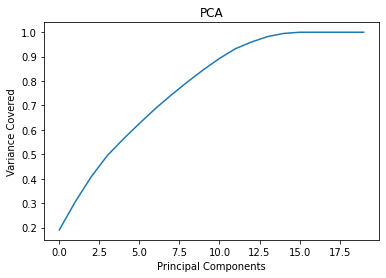

In [37]:
# Lets plot scree plot to check the best components

plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principal Components')
plt.ylabel('Variance Covered')
plt.title('PCA')
plt.show()

**Around 13 components are able to explain more than 95% variance in the dataset and hence its safe to consider 13 PC's**

In [38]:
pca = PCA(n_components=13)
new_pcomp = pca.fit_transform(X_scaler)
princ_comp = pd.DataFrame(new_pcomp,columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12','PC13'])
princ_comp

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13
0,1.645895,2.610917,-0.539950,-0.770856,0.528794,0.959531,-1.174142,-0.116825,-1.839673,-0.325121,0.528146,0.709351,-1.379032
1,0.204822,5.067720,2.509914,1.592371,0.237572,1.399707,-0.040870,-0.464267,-1.743561,-0.735341,1.055875,-0.680191,-1.135735
2,1.142572,2.542232,-0.690260,-0.904437,0.695315,1.601023,-0.724161,-1.388837,-1.475459,-0.160710,1.127599,0.490927,-1.124257
3,1.619263,1.936506,-0.661557,0.832106,0.177841,0.278553,-1.193812,0.299272,-2.613907,0.706132,-1.457627,1.720448,0.775444
4,2.250178,1.851232,0.048931,0.270070,0.201212,0.961785,-0.898434,-0.870321,-1.951961,1.005229,-0.882885,1.746400,0.727761
5,0.943381,4.147374,3.646502,2.248164,0.230515,1.570074,-0.768116,-0.234750,-1.179964,-0.074815,-0.148267,0.431039,0.930176
6,2.067813,0.735291,1.258337,-0.309676,0.249019,1.765455,-1.425961,-0.631611,-1.214862,0.246170,-0.282140,1.926463,0.736995
7,1.665291,0.777226,1.170688,-0.425403,0.324578,1.832021,-1.310196,-1.128640,-0.944551,0.688877,-0.221600,1.565308,0.916789
8,-0.428404,3.295462,3.495795,1.933666,-0.250254,0.236133,0.083190,0.578413,-2.511769,-0.432065,0.230441,-0.538485,-1.333119
9,0.724668,-0.256659,1.845577,-1.341469,0.202307,0.814788,-1.594636,0.673924,-1.380646,-0.439367,0.516292,0.736342,-1.413710


**BEST RANDOM STATE**

In [39]:
from sklearn.model_selection import train_test_split
maxAccu = 0 # Max Accuracy
maxRS = 0   # Best random state for which maximum accuracy is achieved

for i in range(0,1000):
    X_train,X_test,y_train,y_test = train_test_split(princ_comp,y_clf,test_size=0.2,random_state=i)
  
    lr = LogisticRegression()
    
    lr.fit(X_train,y_train)    # Training the model
   
    pred_lr = lr.predict(X_test)    # Predicting the target variable
 
    acc_lr = accuracy_score(y_test,pred_lr)
  
    if acc_lr>maxAccu:
    
        maxAccu = acc_lr
        
        maxRS = i
        
print("Maximum Accuracy:",maxAccu,"at random state ", maxRS)

Maximum Accuracy: 0.9064124783362218 at random state  536


*TRAIN TEST SPLIT USING BEST RANDOM STATE*

In [40]:
X_train,X_test,y_train,y_test = train_test_split(princ_comp,y_clf,test_size=0.2,random_state=536)

**LOGISTIC REGRESSION**

In [41]:
lr = LogisticRegression()

lr.fit(X_train,y_train)

pred_lr = lr.predict(X_test)    # Predicted values

metric_score(lr,X_train,X_test,y_train,y_test,train=True)

metric_score(lr,X_train,X_test,y_train,y_test,train=False)

cr_lr = cross_val_score(lr,princ_comp,y_clf,cv=5)

print("Cross validation score of Logistic regression model :",cr_lr.mean()*100)

-----------------Train Result--------------------
Train Accuracy Score : 88.20%
-----------------Test Result--------------------
=====Confusion Matrix======= 
 [[850  16   0   0]
 [ 12 547  24   1]
 [  0  67 142  12]
 [  0   4  26  30]]
Test Accuracy Score : 90.64%

 Test Classification Report 
                precision    recall  f1-score   support

           1       0.99      0.98      0.98       866
           2       0.86      0.94      0.90       584
           3       0.74      0.64      0.69       221
           4       0.70      0.50      0.58        60

    accuracy                           0.91      1731
   macro avg       0.82      0.77      0.79      1731
weighted avg       0.90      0.91      0.90      1731

Cross validation score of Logistic regression model : 87.6449845222949


*TUNING PARAMETERS FOR LOGISTIC REGRESSION*

In [42]:
lr_params = {'penalty':['l1', 'l2'],
             'tol':[0.0001,0.001,0.01],
             'solver':['newton-cg', 'lbfgs', 'liblinear'],
             'multi_class':['auto', 'ovr', 'multinomial']}

grd_lr = GridSearchCV(lr,param_grid = lr_params, n_jobs =-1)

grd_lr.fit(X_train,y_train)

print("Best parameters : ",grd_lr.best_params_)

Best parameters :  {'multi_class': 'auto', 'penalty': 'l2', 'solver': 'newton-cg', 'tol': 0.0001}


In [43]:
lr = grd_lr.best_estimator_

lr.fit(X_train,y_train)

pred_lr = lr.predict(X_test)    # Predicted values

metric_score(lr,X_train,X_test,y_train,y_test,train=True)

metric_score(lr,X_train,X_test,y_train,y_test,train=False)

cr_lr = cross_val_score(lr,princ_comp,y_clf,cv=5)

print("Cross validation score of Logistic regression model :",cr_lr.mean()*100)

-----------------Train Result--------------------
Train Accuracy Score : 88.20%
-----------------Test Result--------------------
=====Confusion Matrix======= 
 [[850  16   0   0]
 [ 12 547  24   1]
 [  0  67 142  12]
 [  0   4  26  30]]
Test Accuracy Score : 90.64%

 Test Classification Report 
                precision    recall  f1-score   support

           1       0.99      0.98      0.98       866
           2       0.86      0.94      0.90       584
           3       0.74      0.64      0.69       221
           4       0.70      0.50      0.58        60

    accuracy                           0.91      1731
   macro avg       0.82      0.77      0.79      1731
weighted avg       0.90      0.91      0.90      1731

Cross validation score of Logistic regression model : 87.6449845222949


**KNN CLASSIFIER**

In [44]:
knn = KNeighborsClassifier()

knn.fit(X_train,y_train)

pred_knn = knn.predict(X_test)    # Predicted values

metric_score(knn,X_train,X_test,y_train,y_test,train=True)

metric_score(knn,X_train,X_test,y_train,y_test,train=False)

cr_knn = cross_val_score(knn,princ_comp,y_clf,cv=5)

print("Cross validation score of K Neighbors Classifier model :",cr_knn.mean()*100)

-----------------Train Result--------------------
Train Accuracy Score : 80.03%
-----------------Test Result--------------------
=====Confusion Matrix======= 
 [[725 140   1   0]
 [203 354  26   1]
 [ 10  76 130   5]
 [  1   7  31  21]]
Test Accuracy Score : 71.06%

 Test Classification Report 
                precision    recall  f1-score   support

           1       0.77      0.84      0.80       866
           2       0.61      0.61      0.61       584
           3       0.69      0.59      0.64       221
           4       0.78      0.35      0.48        60

    accuracy                           0.71      1731
   macro avg       0.71      0.60      0.63      1731
weighted avg       0.71      0.71      0.71      1731

Cross validation score of K Neighbors Classifier model : 62.565251800723296


*TUNING PARAMETERS FOR KNN*

In [48]:
 params_knn = { 'n_neighbors':[4,5],
        'weights':['uniform','distance'],
    'algorithm':['auto','ball_tree','brute'],
    'leaf_size':[25,30]}

grd_knn = GridSearchCV(knn,param_grid = params_knn, n_jobs =-1)

grd_knn.fit(X_train,y_train)

print("Best parameters : ",grd_knn.best_params_)

Best parameters :  {'algorithm': 'auto', 'leaf_size': 25, 'n_neighbors': 4, 'weights': 'distance'}


In [49]:
knn = grd_knn.best_estimator_

knn.fit(X_train,y_train)

pred_knn = knn.predict(X_test)    # Predicted values

metric_score(knn,X_train,X_test,y_train,y_test,train=True)

metric_score(knn,X_train,X_test,y_train,y_test,train=False)

cr_knn = cross_val_score(knn,princ_comp,y_clf,cv=5)

print("Cross validation score of K Neighbors Classifier model :",cr_knn.mean()*100)

-----------------Train Result--------------------
Train Accuracy Score : 100.00%
-----------------Test Result--------------------
=====Confusion Matrix======= 
 [[717 144   5   0]
 [167 380  35   2]
 [  3  67 140  11]
 [  0   7  29  24]]
Test Accuracy Score : 72.85%

 Test Classification Report 
                precision    recall  f1-score   support

           1       0.81      0.83      0.82       866
           2       0.64      0.65      0.64       584
           3       0.67      0.63      0.65       221
           4       0.65      0.40      0.49        60

    accuracy                           0.73      1731
   macro avg       0.69      0.63      0.65      1731
weighted avg       0.73      0.73      0.73      1731

Cross validation score of K Neighbors Classifier model : 61.90679983837736


**DECISION TREE CLASSIFIER**

In [50]:
dt = DecisionTreeClassifier()

dt.fit(X_train,y_train)      # Model training

pred_dt = dt.predict(X_test)    # Predicted values

metric_score(dt,X_train,X_test,y_train,y_test,train=True)  # Training result

metric_score(dt,X_train,X_test,y_train,y_test,train=False)  # Test result

cr_dt = cross_val_score(dt,princ_comp,y_clf,cv=5)

print("Cross validation score of Decision Tree Classifier model :",cr_dt.mean()*100)

-----------------Train Result--------------------
Train Accuracy Score : 100.00%
-----------------Test Result--------------------
=====Confusion Matrix======= 
 [[710 146   9   1]
 [145 380  52   7]
 [  5  70 122  24]
 [  2   2  26  30]]
Test Accuracy Score : 71.75%

 Test Classification Report 
                precision    recall  f1-score   support

           1       0.82      0.82      0.82       866
           2       0.64      0.65      0.64       584
           3       0.58      0.55      0.57       221
           4       0.48      0.50      0.49        60

    accuracy                           0.72      1731
   macro avg       0.63      0.63      0.63      1731
weighted avg       0.72      0.72      0.72      1731

Cross validation score of Decision Tree Classifier model : 62.19601753805979


*TUNING PARAMETERS FOR DECISION TREE*

In [51]:
grid_param = {'criterion':['gini','entropy'],
              'max_depth': (10,15,20),
              'min_samples_leaf': range(3,7),
              'min_samples_split': range(2,6)
             }

grid_search = GridSearchCV(estimator = dt, param_grid = grid_param,n_jobs =-1)

grid_search.fit(X_train,y_train)

print("Best parameters : ",grid_search.best_params_)

Best parameters :  {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 5, 'min_samples_split': 3}


In [52]:
dt = grid_search.best_estimator_

dt.fit(X_train,y_train)      # Model training

pred_dt = dt.predict(X_test)    # Predicted values

metric_score(dt,X_train,X_test,y_train,y_test,train=True)  # Training result

metric_score(dt,X_train,X_test,y_train,y_test,train=False)  # Test result

cr_dt = cross_val_score(dt,princ_comp,y_clf,cv=5)

print("Cross validation score of Decision Tree Classifier model :",cr_dt.mean()*100)

-----------------Train Result--------------------
Train Accuracy Score : 84.89%
-----------------Test Result--------------------
=====Confusion Matrix======= 
 [[711 150   5   0]
 [124 420  35   5]
 [  7  67 110  37]
 [  2   6  28  24]]
Test Accuracy Score : 73.08%

 Test Classification Report 
                precision    recall  f1-score   support

           1       0.84      0.82      0.83       866
           2       0.65      0.72      0.68       584
           3       0.62      0.50      0.55       221
           4       0.36      0.40      0.38        60

    accuracy                           0.73      1731
   macro avg       0.62      0.61      0.61      1731
weighted avg       0.73      0.73      0.73      1731

Cross validation score of Decision Tree Classifier model : 65.23535795741043


**RANDOM FOREST CLASSIFIER**

In [53]:
rf = RandomForestClassifier()

rf.fit(X_train,y_train)      # Model training

pred_rf = rf.predict(X_test)    # Predicted values

metric_score(rf,X_train,X_test,y_train,y_test,train=True)  # Training result

metric_score(rf,X_train,X_test,y_train,y_test,train=False)  # Test result

cr_rf = cross_val_score(rf,princ_comp,y_clf,cv=5)

print("Cross validation score of Random Forest Classifier model :",cr_rf.mean()*100)

-----------------Train Result--------------------
Train Accuracy Score : 100.00%
-----------------Test Result--------------------
=====Confusion Matrix======= 
 [[765  98   3   0]
 [111 448  25   0]
 [  1  68 150   2]
 [  0   4  33  23]]
Test Accuracy Score : 80.07%

 Test Classification Report 
                precision    recall  f1-score   support

           1       0.87      0.88      0.88       866
           2       0.72      0.77      0.75       584
           3       0.71      0.68      0.69       221
           4       0.92      0.38      0.54        60

    accuracy                           0.80      1731
   macro avg       0.81      0.68      0.71      1731
weighted avg       0.80      0.80      0.80      1731

Cross validation score of Random Forest Classifier model : 69.68502285758174


*TUNING PARAMETERS FOR RANDOM FOREST CLASSIFIER*

In [54]:
params_rf = {'criterion':['gini','entropy'],
         'max_depth': [10,20,25,30],
         'min_samples_split' :[2,3,4],
         'min_samples_leaf' :[2,3,4,5]}

grd_rf = GridSearchCV(rf,param_grid = params_rf,n_jobs =-1)

grd_rf.fit(X_train,y_train)

print("Best parameters : ",grd_rf.best_params_)

Best parameters :  {'criterion': 'entropy', 'max_depth': 25, 'min_samples_leaf': 2, 'min_samples_split': 3}


In [55]:
rf = grd_rf.best_estimator_

rf.fit(X_train,y_train)

pred_rf = rf.predict(X_test)    # Predicted values

metric_score(rf,X_train,X_test,y_train,y_test,train=True)  # Training result

metric_score(rf,X_train,X_test,y_train,y_test,train=False)  # Test result

cr_rf = cross_val_score(rf,princ_comp,y_clf,cv=5)

print("Cross validation score of Random Forest Classifier model :",cr_rf.mean()*100)

-----------------Train Result--------------------
Train Accuracy Score : 99.74%
-----------------Test Result--------------------
=====Confusion Matrix======= 
 [[776  88   2   0]
 [114 444  26   0]
 [  2  71 146   2]
 [  0   6  29  25]]
Test Accuracy Score : 80.36%

 Test Classification Report 
                precision    recall  f1-score   support

           1       0.87      0.90      0.88       866
           2       0.73      0.76      0.74       584
           3       0.72      0.66      0.69       221
           4       0.93      0.42      0.57        60

    accuracy                           0.80      1731
   macro avg       0.81      0.68      0.72      1731
weighted avg       0.81      0.80      0.80      1731

Cross validation score of Random Forest Classifier model : 70.65582726413614


**SUPPORT VECTOR CLASSIFIER**

In [56]:
svc = SVC()

svc.fit(X_train,y_train)

pred_svc = svc.predict(X_test)    # Predicted values

metric_score(svc,X_train,X_test,y_train,y_test,train=True)

metric_score(svc,X_train,X_test,y_train,y_test,train=False)

cr_svc = cross_val_score(svc,princ_comp,y_clf,cv=5)

print("Cross validation score of Support Vector Classifier model :",cr_svc.mean()*100)

-----------------Train Result--------------------
Train Accuracy Score : 89.02%
-----------------Test Result--------------------
=====Confusion Matrix======= 
 [[834  32   0   0]
 [ 28 524  32   0]
 [  0  52 168   1]
 [  0   1  36  23]]
Test Accuracy Score : 89.49%

 Test Classification Report 
                precision    recall  f1-score   support

           1       0.97      0.96      0.97       866
           2       0.86      0.90      0.88       584
           3       0.71      0.76      0.74       221
           4       0.96      0.38      0.55        60

    accuracy                           0.89      1731
   macro avg       0.87      0.75      0.78      1731
weighted avg       0.90      0.89      0.89      1731

Cross validation score of Support Vector Classifier model : 82.05169920824943


*TUNING PARAMETERS FOR SVC*

In [57]:
svc_params = {'kernel':['rbf','linear','poly','sigmoid'],
              'gamma':['scale','auto'],
              'decision_function_shape':['ovr','ovo']
              }

grd_svc = GridSearchCV(svc,param_grid = svc_params,n_jobs =-1)

grd_svc.fit(X_train,y_train)

print("Best parameters : ",grd_svc.best_params_)

Best parameters :  {'decision_function_shape': 'ovr', 'gamma': 'scale', 'kernel': 'linear'}


In [58]:
svc = grd_svc.best_estimator_

svc.fit(X_train,y_train)

pred_svc = svc.predict(X_test)    # Predicted values

metric_score(svc,X_train,X_test,y_train,y_test,train=True)

metric_score(svc,X_train,X_test,y_train,y_test,train=False)

cr_svc = cross_val_score(svc,princ_comp,y_clf,cv=5)

print("Cross validation score of Support Vector Classifier model :",cr_svc.mean()*100)

-----------------Train Result--------------------
Train Accuracy Score : 87.39%
-----------------Test Result--------------------
=====Confusion Matrix======= 
 [[847  19   0   0]
 [ 13 542  29   0]
 [  0  77 135   9]
 [  0   4  30  26]]
Test Accuracy Score : 89.54%

 Test Classification Report 
                precision    recall  f1-score   support

           1       0.98      0.98      0.98       866
           2       0.84      0.93      0.88       584
           3       0.70      0.61      0.65       221
           4       0.74      0.43      0.55        60

    accuracy                           0.90      1731
   macro avg       0.82      0.74      0.77      1731
weighted avg       0.89      0.90      0.89      1731

Cross validation score of Support Vector Classifier model : 87.46002678127182


Among all the above models,**Support Vector Classifier** is the **best model** due to minimum difference between training and test accuracy

We will save the model using **Support vector Classifier model**

**SAVING MODEL FOR CLASSIFICATION TASK (PRICE RANGE)**

In [61]:
filename = 'price_range_prediction_clf.pkl'
pickle.dump(svc,open(filename,'wb'))

**CONCLUSION FOR PRICE RANGE PREDICTION (CLASSIFCATION TASK)**

In [62]:
loaded_model = pickle.load(open('price_range_prediction_clf.pkl','rb'))

pred_svc = loaded_model.predict(X_test)

result = accuracy_score(y_test,pred_svc)

print(result*100)

89.54361640670133


In [63]:
conclusion_clf = pd.DataFrame([pred_svc,y_test],index=['Predicted','Original'])

conclusion_clf

,0,1,2,3,4,5,6,7,8,9,...,1721,1722,1723,1724,1725,1726,1727,1728,1729,1730
Predicted,3,1,2,2,2,2,1,2,1,1,...,4,2,1,2,2,2,1,1,2,2
Original,2,1,2,2,2,2,1,2,1,1,...,4,2,1,2,2,2,1,1,3,2
